In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/README.dataset.txt
/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/README.roboflow.txt
/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/data.yaml
/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/valid/labels/nevus-198-_jpg.rf.4cfc5a27de83227be466b27e7d0bea11.txt
/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/valid/labels/nevus-156-_jpg.rf.6a78ae267b7fb69dc35d4bbb7177cb1c.txt
/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/valid/labels/6_jpg.rf.26624b00e099faeeedb03fa1e9d9b614.txt
/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/valid/labels/Lupus-Erythematosus-Chronicus-Discoides-75-_jpg.rf.7cc51c277bc39b796e61ecea3b41542f.txt
/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/valid/labels/LEISHMANIOSE-50-_jpg.rf.9190a66c603a371bc29b9b1131a98a02.txt
/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/valid/labels/nevus-184-_jpg.rf.f9a64a85e5

In [2]:
# Pip install method (recommended)
%pip install ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 876.6/876.6 kB 18.7 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns
import torch

sns.set_style('darkgrid')

%matplotlib inline

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


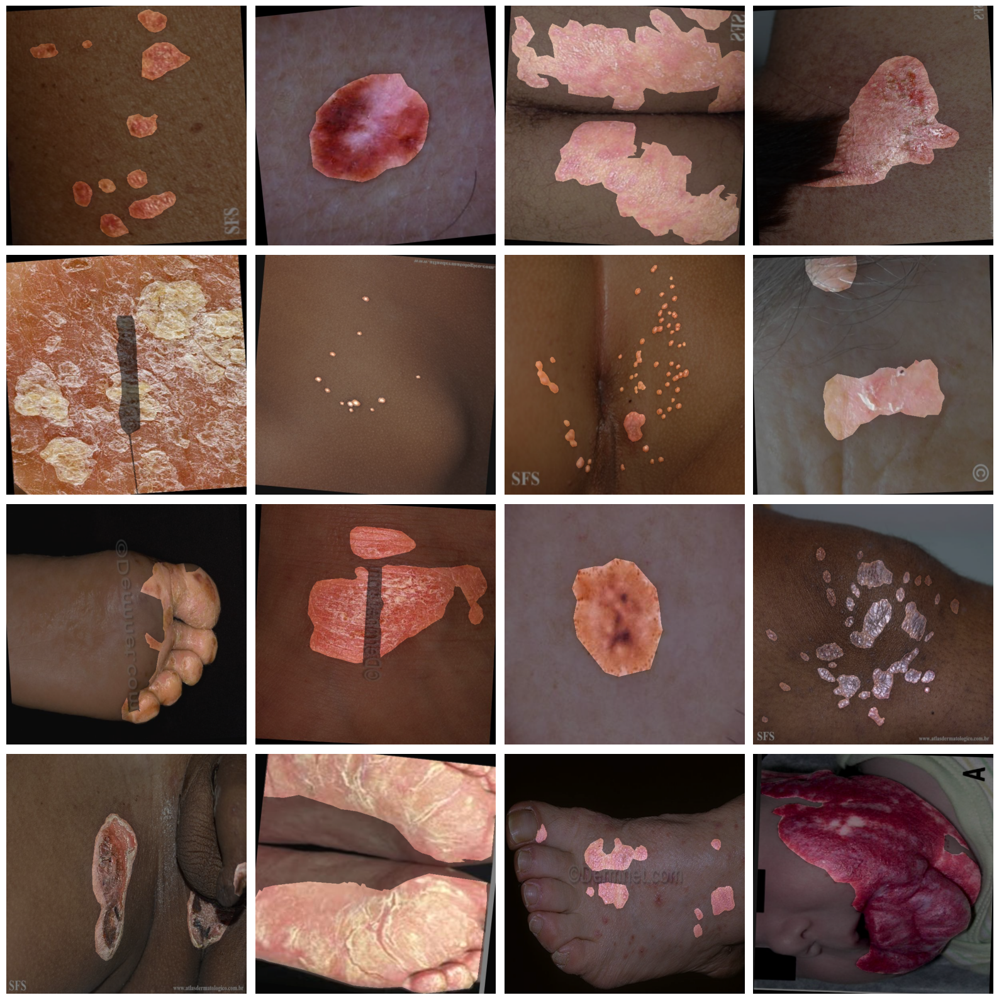

In [4]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/train/images"
train_labels = "/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/train/labels"

test_images = "/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images"
test_labels = "/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/labels"

val_images = "/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/valid/images"
val_labels = "/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/valid/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the segmentations
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)
    
    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    
    # Create a mask of the same size as the image
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")
    
    # Loop over the labels and create segmentation masks
    for label in labels:
        parts = label.split()
        if len(parts) < 5:  # Skip if not enough data
            continue
        class_id = int(parts[0])
        points = list(map(float, parts[1:]))
        
        # Convert normalized coordinates to pixel coordinates
        points = np.array([(points[i] * image.shape[1], points[i+1] * image.shape[0]) 
                           for i in range(0, len(points), 2)], dtype=np.int32)
        
        # Draw filled polygon on mask
        cv2.fillPoly(mask, [points], color=(255))
    
    # Apply the mask to the image
    segmented = cv2.bitwise_and(image, image, mask=mask)
    
    # Blend the original image with the segmentation
    alpha = 0.5
    blended = cv2.addWeighted(image, alpha, segmented, 1-alpha, 0)
    
    # Show the blended image with the segmentations
    axs[row, col].imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.tight_layout()
plt.show()

In [5]:
# Load an image using OpenCV
image = cv2.imread("/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/train/images/07Acne081101_jpg.rf.04958649a14fb579c2fa104cdaf22350.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 600x600 and 3 channels.


In [6]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLO11n model
model = YOLO("yolo11s-seg.pt")

100%|██████████| 19.7M/19.7M [00:00<00:00, 136MB/s] 


In [7]:

# free up GPU memory
torch.cuda.empty_cache()

# Train the model
model.train(
    data='/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/data.yaml',  
    epochs=50,
    imgsz=640,
    optimizer="AdamW",
    lr0=0.0001,
    momentum=0.950,
    batch=32,
    device='0'                       
)

Ultralytics 8.3.17 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolo11s-seg.pt, data=/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/data.yaml, epochs=50, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show

100%|██████████| 755k/755k [00:00<00:00, 22.5MB/s]
2024-10-19 05:24:45,377	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-19 05:24:45,964	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=19

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytic

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...


100%|██████████| 5.35M/5.35M [00:00<00:00, 108MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/train/labels... 8070 images, 9 backgrounds, 0 corrupt: 100%|██████████| 8070/8070 [00:44<00:00, 182.88it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/valid/labels... 658 images, 1 backgrounds, 0 corrupt: 100%|██████████| 658/658 [00:03<00:00, 169.52it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/valid is not writeable, cache not saved.
Plotting labels to runs/segment/train/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.95) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/segment/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/50      14.3G      1.367      2.312      2.586      1.211         19        640: 100%|██████████| 253/253 [03:58<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.21it/s]

                   all        658       2609      0.287       0.31      0.255       0.16      0.279      0.279      0.232      0.124



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/50      14.3G      1.289      2.053      1.798      1.146         20        640: 100%|██████████| 253/253 [03:57<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.18it/s]

                   all        658       2609      0.488      0.453      0.454        0.3       0.48      0.444       0.44      0.258



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/50      12.9G      1.247      1.968      1.573      1.125         35        640: 100%|██████████| 253/253 [03:50<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.17it/s]

                   all        658       2609       0.51      0.574      0.544      0.367       0.53      0.559       0.54      0.337



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/50      13.8G      1.222      1.894      1.435      1.114         36        640: 100%|██████████| 253/253 [03:50<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.21it/s]

                   all        658       2609      0.563      0.546      0.572      0.394      0.561      0.551      0.572      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/50      14.3G      1.194      1.841      1.326        1.1         84        640: 100%|██████████| 253/253 [03:49<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.16it/s]

                   all        658       2609      0.602      0.564      0.594      0.398      0.601      0.559      0.584      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/50      14.9G      1.191      1.822      1.261      1.095         36        640: 100%|██████████| 253/253 [03:50<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.19it/s]

                   all        658       2609      0.628      0.608      0.647      0.449      0.628       0.61      0.647      0.413



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/50      13.9G      1.161      1.803      1.203      1.087         69        640: 100%|██████████| 253/253 [03:49<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.15it/s]

                   all        658       2609      0.635      0.647      0.653      0.445      0.642      0.646      0.656      0.412



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/50      15.4G      1.151       1.77      1.146       1.08        201        640: 100%|██████████| 253/253 [03:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.19it/s]

                   all        658       2609      0.631      0.624      0.651      0.446      0.626      0.628      0.654      0.416



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/50      12.7G       1.15      1.754       1.11      1.075         58        640: 100%|██████████| 253/253 [03:50<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.18it/s]

                   all        658       2609      0.643      0.607      0.656      0.449      0.647      0.611      0.658      0.415



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/50      14.7G      1.131      1.729      1.064       1.07         42        640: 100%|██████████| 253/253 [03:48<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.18it/s]

                   all        658       2609       0.66      0.674      0.693      0.469      0.664      0.667       0.69       0.44



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/50      14.1G      1.115      1.695      1.024      1.062         26        640: 100%|██████████| 253/253 [03:48<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.18it/s]

                   all        658       2609      0.666      0.632      0.693      0.483      0.673      0.639      0.699      0.449



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/50      15.3G      1.104      1.677      1.007      1.058         25        640: 100%|██████████| 253/253 [03:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.20it/s]

                   all        658       2609      0.638      0.632      0.644      0.445      0.649       0.62      0.644      0.413



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/50      13.1G      1.096      1.679     0.9794      1.053         60        640: 100%|██████████| 253/253 [03:48<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.17it/s]

                   all        658       2609      0.682      0.658      0.691      0.481      0.686      0.665      0.695       0.45



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/50      15.4G      1.099      1.664     0.9547       1.05         36        640: 100%|██████████| 253/253 [03:49<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.22it/s]

                   all        658       2609      0.723      0.641      0.715      0.492      0.725      0.643      0.716      0.454



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/50      14.9G      1.092      1.659     0.9289      1.047         49        640: 100%|██████████| 253/253 [03:46<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.19it/s]

                   all        658       2609      0.682      0.678        0.7      0.482      0.692      0.677      0.705      0.452



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/50      15.5G      1.066      1.624     0.9032      1.041         82        640: 100%|██████████| 253/253 [03:49<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.21it/s]

                   all        658       2609      0.674      0.702      0.709      0.497      0.729      0.639      0.707      0.456



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/50      14.4G      1.069      1.624     0.8878      1.037         34        640: 100%|██████████| 253/253 [03:48<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.22it/s]

                   all        658       2609      0.679      0.705      0.714      0.495      0.697       0.69      0.719      0.462



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/50      14.6G      1.064      1.601     0.8701      1.032         20        640: 100%|██████████| 253/253 [03:48<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.24it/s]

                   all        658       2609      0.664      0.677       0.69      0.482      0.689      0.654      0.689      0.443



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/50      15.4G      1.047      1.581     0.8471      1.026         19        640: 100%|██████████| 253/253 [03:50<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.17it/s]

                   all        658       2609      0.698      0.681      0.722      0.506      0.751      0.646      0.726      0.471



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/50        12G      1.049      1.591     0.8416      1.026         26        640: 100%|██████████| 253/253 [03:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.21it/s]

                   all        658       2609      0.726      0.693      0.734      0.514      0.732      0.683       0.73      0.473



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/50      14.9G      1.038       1.57      0.828      1.025         91        640: 100%|██████████| 253/253 [03:45<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]

                   all        658       2609      0.694      0.708      0.723      0.506      0.703      0.707      0.729       0.47



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/50      12.2G      1.035       1.56     0.8029      1.017         48        640: 100%|██████████| 253/253 [03:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.22it/s]

                   all        658       2609      0.742        0.7      0.739      0.515      0.747      0.694      0.738      0.477



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/50      13.1G      1.025      1.545     0.7903      1.016         45        640: 100%|██████████| 253/253 [03:45<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]

                   all        658       2609      0.711        0.7      0.732      0.512       0.71        0.7      0.732      0.472



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/50      12.2G       1.03       1.55     0.7899      1.014         28        640: 100%|██████████| 253/253 [03:48<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]

                   all        658       2609      0.679      0.708      0.722      0.507      0.684      0.704      0.726      0.478



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/50      13.8G      1.007      1.529     0.7709      1.007         20        640: 100%|██████████| 253/253 [03:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.21it/s]

                   all        658       2609      0.743      0.676       0.74      0.522      0.733      0.677      0.739      0.491



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/50        15G      1.008      1.523     0.7561      1.004         50        640: 100%|██████████| 253/253 [03:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]

                   all        658       2609      0.725      0.699      0.743      0.524      0.728        0.7      0.745      0.486



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/50        12G      1.018      1.536     0.7584      1.007         59        640: 100%|██████████| 253/253 [03:48<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.21it/s]

                   all        658       2609      0.733        0.7      0.744      0.523      0.734      0.699      0.746      0.486



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/50      15.4G      1.003      1.514     0.7455      1.002         25        640: 100%|██████████| 253/253 [03:48<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.21it/s]

                   all        658       2609      0.729      0.681      0.741      0.522      0.737      0.679      0.741      0.482



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/50      14.7G     0.9917      1.494     0.7356     0.9991         12        640: 100%|██████████| 253/253 [03:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.21it/s]

                   all        658       2609      0.719       0.71      0.755      0.527      0.747      0.689      0.754      0.491



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/50      13.9G     0.9795      1.476     0.7156      0.995         35        640: 100%|██████████| 253/253 [03:49<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.18it/s]

                   all        658       2609      0.736      0.699      0.744      0.516      0.737      0.701      0.743      0.485



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/50      13.7G      0.983      1.476     0.7054     0.9909         34        640: 100%|██████████| 253/253 [03:49<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.21it/s]

                   all        658       2609      0.737      0.692      0.743      0.527      0.747      0.682      0.746      0.488



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/50      14.7G     0.9823      1.477      0.705     0.9904        159        640: 100%|██████████| 253/253 [03:46<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.24it/s]

                   all        658       2609       0.74      0.696      0.742      0.523      0.738       0.69       0.74      0.489



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/50      14.1G     0.9772      1.475     0.6994     0.9864         37        640: 100%|██████████| 253/253 [03:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.22it/s]

                   all        658       2609      0.728      0.701      0.737      0.521      0.734      0.704      0.746      0.488



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/50      14.3G     0.9732      1.462     0.6914     0.9875         39        640: 100%|██████████| 253/253 [03:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]

                   all        658       2609      0.711      0.708      0.741      0.524      0.718      0.713      0.749      0.491



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/50        12G     0.9756      1.459     0.6786     0.9836         36        640: 100%|██████████| 253/253 [03:49<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.23it/s]

                   all        658       2609       0.73      0.704      0.747      0.525      0.738      0.702      0.755      0.493



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/50      12.8G     0.9529      1.437     0.6714      0.981         84        640: 100%|██████████| 253/253 [03:45<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.24it/s]

                   all        658       2609      0.761      0.708      0.756      0.534      0.775      0.704      0.762      0.501



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/50      14.6G     0.9517      1.434     0.6642     0.9765         32        640: 100%|██████████| 253/253 [03:45<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]

                   all        658       2609      0.765      0.695      0.759      0.534      0.772      0.702      0.767      0.499



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/50      11.8G     0.9583      1.441     0.6604     0.9764         57        640: 100%|██████████| 253/253 [03:48<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.23it/s]

                   all        658       2609      0.737        0.7      0.752      0.534      0.739      0.703      0.754      0.495



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/50      15.2G     0.9465      1.427     0.6484     0.9735         75        640: 100%|██████████| 253/253 [03:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]

                   all        658       2609      0.755      0.714      0.757      0.532      0.759      0.713       0.76      0.494



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/50      14.8G     0.9426       1.42     0.6486     0.9757         37        640: 100%|██████████| 253/253 [03:47<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.20it/s]

                   all        658       2609      0.742      0.717      0.757      0.534       0.76      0.708      0.763      0.497


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/50      14.9G     0.9728      1.427     0.6008     0.9646          7        640: 100%|██████████| 253/253 [03:15<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]

                   all        658       2609      0.751      0.723      0.757      0.536      0.765      0.726      0.765      0.497



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/50      12.5G     0.9574      1.395     0.5751     0.9558         32        640: 100%|██████████| 253/253 [03:13<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]

                   all        658       2609      0.777      0.704      0.757      0.537      0.784      0.704      0.764      0.501



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/50      13.7G     0.9533      1.395     0.5717     0.9574          9        640: 100%|██████████| 253/253 [03:13<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]

                   all        658       2609      0.745      0.723      0.752      0.539      0.749      0.722       0.76        0.5



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/50        13G     0.9475      1.393     0.5598     0.9479        104        640: 100%|██████████| 253/253 [03:14<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]

                   all        658       2609      0.781      0.694      0.754       0.54      0.784      0.696      0.759      0.501



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/50      12.7G      0.938      1.374     0.5528     0.9479         56        640: 100%|██████████| 253/253 [03:13<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]

                   all        658       2609      0.744      0.711      0.752      0.538      0.764      0.709       0.76      0.502



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/50      13.1G     0.9289      1.366     0.5486     0.9443         17        640: 100%|██████████| 253/253 [03:13<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.29it/s]

                   all        658       2609      0.751       0.73      0.754       0.54      0.752      0.733      0.758      0.503



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/50      12.2G     0.9274      1.357     0.5444     0.9411         49        640: 100%|██████████| 253/253 [03:14<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]

                   all        658       2609       0.77      0.718      0.761      0.542      0.767      0.716      0.761      0.501



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/50      14.2G     0.9226      1.358     0.5369     0.9374         57        640: 100%|██████████| 253/253 [03:13<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]

                   all        658       2609      0.742       0.74      0.759      0.546      0.745      0.741      0.766      0.507



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/50      14.2G     0.9176      1.347     0.5321      0.939         60        640: 100%|██████████| 253/253 [03:14<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]

                   all        658       2609      0.775      0.708      0.758      0.542      0.788      0.706      0.764      0.505



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/50      12.6G     0.9197      1.352     0.5311     0.9418         14        640: 100%|██████████| 253/253 [03:13<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.29it/s]

                   all        658       2609      0.748      0.734      0.762      0.547      0.757      0.733      0.768      0.507



50 epochs completed in 3.226 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 20.5MB
Optimizer stripped from runs/segment/train/weights/best.pt, 20.5MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.17 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-seg summary (fused): 265 layers, 10,074,169 parameters, 0 gradients, 35.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.14it/s]


                   all        658       2609      0.755      0.729      0.762      0.547      0.764      0.724      0.767      0.507
      Darier_s-Disease         28         31      0.812      0.806      0.808      0.588      0.826      0.806      0.797      0.493
Epidermolysis-Bullosa-Pruriginosa         16        136      0.537      0.684      0.638       0.37      0.556      0.699      0.654      0.336
 Hailey-Hailey-Disease         19         30      0.822        0.7      0.796      0.572      0.827        0.7      0.796      0.528
            Hemangiome         20         61      0.951      0.705      0.887       0.71      0.954      0.687      0.882      0.613
              Impetigo         34        108      0.527      0.593      0.541      0.364      0.543      0.593      0.551      0.328
           Leishmanios         17         43      0.727      0.557      0.711      0.459       0.72      0.537      0.711      0.466
Lupus-Erythematosus-Chronicus-Discoides         23        

lr/pg0,█▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
lr/pg1,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁
metrics/mAP50(B),▁▄▅▅▆▆▆▇▇▇▇▇▇▇▇█▇██▇████████████████████
metrics/mAP50(M),▁▄▅▅▆▇▇▇▇▆▇▇▇▇▇███▇█████████████████████
metrics/mAP50-95(B),▁▄▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇████▇███████████████
metrics/mAP50-95(M),▁▃▅▅▅▆▆▇▇▆▇▇▇▇▇▇▇▇▇▇████████████████████
metrics/precision(B),▁▄▄▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇█▇█▇▇▇▇▇▇▇▇███████████
metrics/precision(M),▁▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██████████▇█
metrics/recall(B),▁▃▅▅▅▇▆▆▇▆▇▇▇██▇▇█▇▇▇▇▇▇█▇▇███▇▇████▇███
metrics/recall(M),▁▄▅▅▅▇▆▆▇▆▇▇▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇▇██▇██████


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f21255513c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.

In [8]:
%matplotlib inline
# Loading the best performing model
model = YOLO('/kaggle/working/runs/segment/train/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics 8.3.17 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-seg summary (fused): 265 layers, 10,074,169 parameters, 0 gradients, 35.3 GFLOPs


val: Scanning /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/labels... 364 images, 0 backgrounds, 0 corrupt: 100%|██████████| 364/364 [00:02<00:00, 158.13it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test is not writeable, cache not saved.



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.84it/s]


                   all        364       1133      0.731      0.586      0.677      0.506      0.715      0.574      0.661      0.459
      Darier_s-Disease         15         20      0.701        0.4      0.565      0.471      0.703        0.4      0.565      0.438
Epidermolysis-Bullosa-Pruriginosa         13        104      0.591     0.0385      0.259      0.168      0.596     0.0385      0.293      0.164
 Hailey-Hailey-Disease          8          9      0.536      0.667      0.743      0.399      0.447      0.556      0.586      0.336
            Hemangiome         10         20      0.876      0.706      0.826       0.57      0.875      0.699      0.826      0.418
              Impetigo         18         33      0.662      0.576      0.639      0.492      0.663      0.576      0.639      0.456
           Leishmanios          8         16      0.899      0.312      0.594      0.452        0.9      0.312      0.594      0.442
Lupus-Erythematosus-Chronicus-Discoides         16        

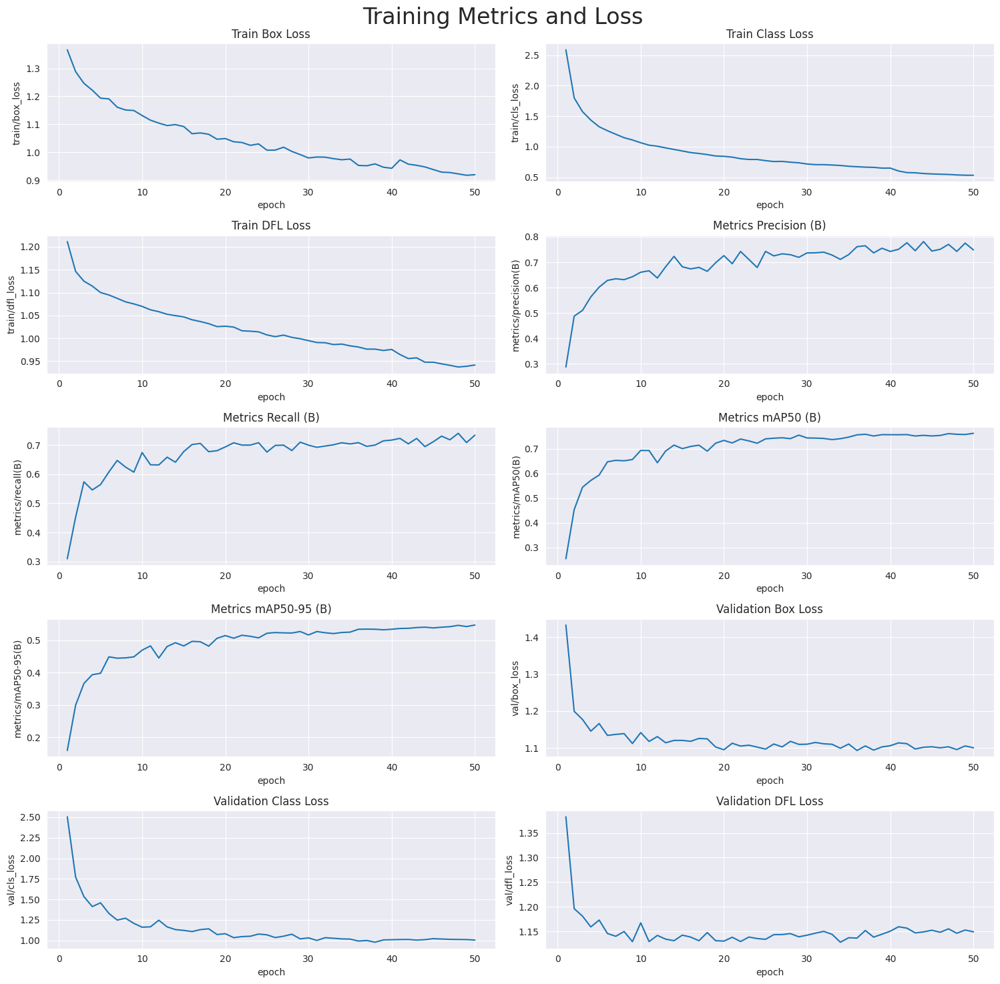

In [9]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/segment/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [10]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 640x640 1 Hailey-Hailey-Disease, 1 Psoriasis, 1 eczema, 26.0ms
Speed: 4.1ms preprocess, 26.0ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 13 lichens, 26.1ms
Speed: 3.8ms preprocess, 26.1ms inference, 7.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 basal-cell-carcinoma, 26.1ms
Speed: 4.8ms preprocess, 26.1ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Molluscum-Contagiosum, 24.0ms
Speed: 4.0ms preprocess, 24.0ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 12 Molluscum-Contagiosums, 22.7ms
Speed: 3.2ms preprocess, 22.7ms inference, 6.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Lupus-Erythematosus-Chronicus-Discoides, 22.6ms
Speed: 3.5ms preprocess, 22.6ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Melanoma, 22.4ms
Speed: 2.6ms preprocess, 22.4ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 64

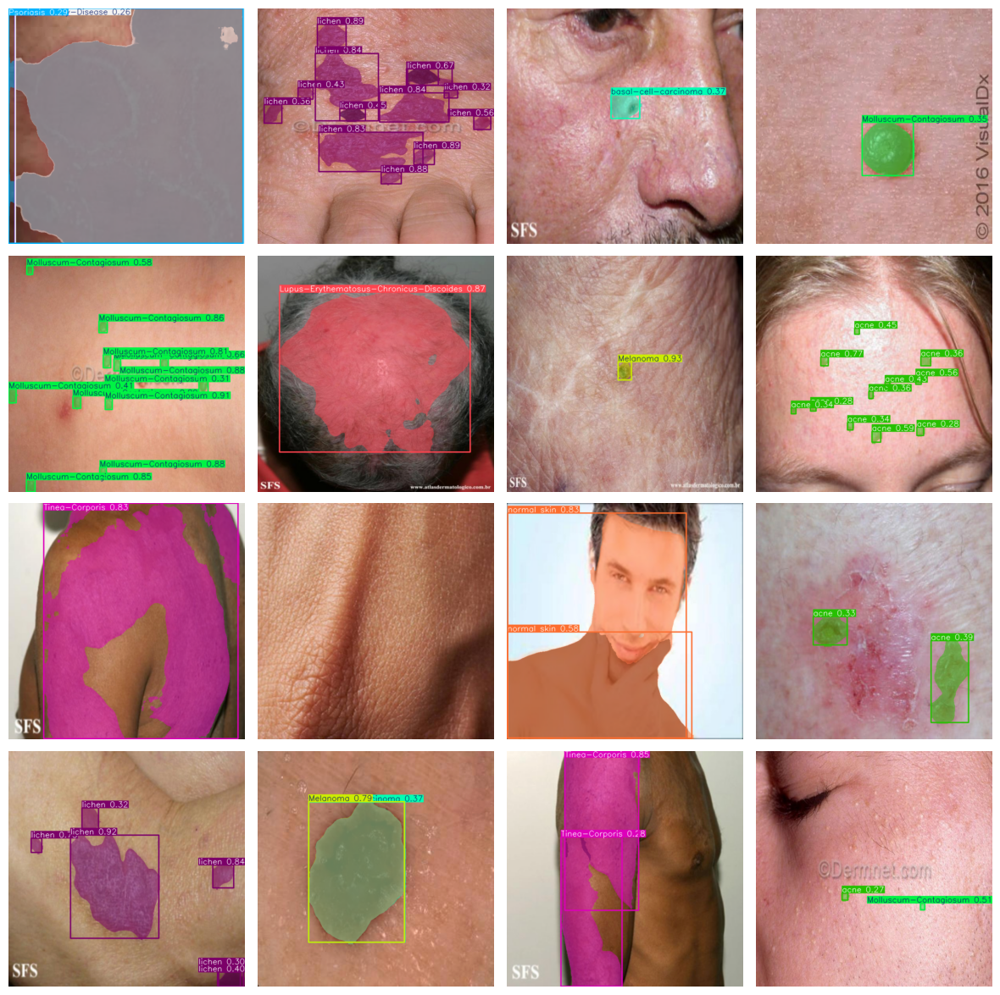

In [11]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

In [12]:

# Path to your trained model weights
model_weights_path = '/kaggle/working/runs/segment/train/weights/best.pt'

# Load the trained YOLO model
trained_model = YOLO(model_weights_path)

# Path to your test images directory (assuming all images are directly in this folder)
test_images_path = '/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images'

# Perform predictions on all images in the test folder
predictions = trained_model.predict(
    source=test_images_path,
    conf=0.25,  # Confidence threshold
    save_txt=True,  # Save predictions as text files
    save_conf=True  # Save confidence scores
)

# Output predictions
print('Predictions:', predictions)



image 1/364 /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images/12_jpg.rf.de03f29b3f7b538f00e4b058e4e9e65e.jpg: 640x640 1 normal skin, 26.0ms
image 2/364 /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images/134356_jpg.rf.337ccf84baa05df8f5f36ba062984a7f.jpg: 640x640 (no detections), 26.1ms
image 3/364 /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images/16_jpg.rf.3fab3af4f09e64b09b7a9a8d3d5f39e1.jpg: 640x640 1 normal skin, 24.3ms
image 4/364 /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images/20150721042601_primary_jpg.rf.08a0ab2592dde08268bed9e93ad8fc04.jpg: 640x640 34 acnes, 24.2ms
image 5/364 /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images/2452275_jpg.rf.a42231cab88a4e0635df9a240161f12a.jpg: 640x640 2 Hemangiomes, 23.9ms
image 6/364 /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images/29_jpg.rf.ebc38793a671b2479444ebb998a63f2e.jpg: 640x640 1 normal skin, 22.6ms
i


image 1/1 /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images/Lupus-Erythematosus-Chronicus-Discoides-50-_jpg.rf.6c7192a7c4a878294ca1941e0c0da252.jpg: 640x640 3 Lupus-Erythematosus-Chronicus-Discoidess, 15.7ms
Speed: 3.2ms preprocess, 15.7ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict
325 labels saved to runs/segment/predict/labels
Prediction result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'Darier_s-Disease', 1: 'Epidermolysis-Bullosa-Pruriginosa', 2: 'Hailey-Hailey-Disease', 3: 'Hemangiome', 4: 'Impetigo', 5: 'Leishmanios', 6: 'Lupus-Erythematosus-Chronicus-Discoides', 7: 'Melanoma', 8: 'Molluscum-Contagiosum', 9: 'Porokeratosis', 10: 'Psoriasis', 11: 'Tinea-Corporis', 12: 'Tungiasis', 13: 'acne', 14: 'basal-cell-carcinoma', 15: 'eczema', 16: 'lichen', 17: 'nevus', 1

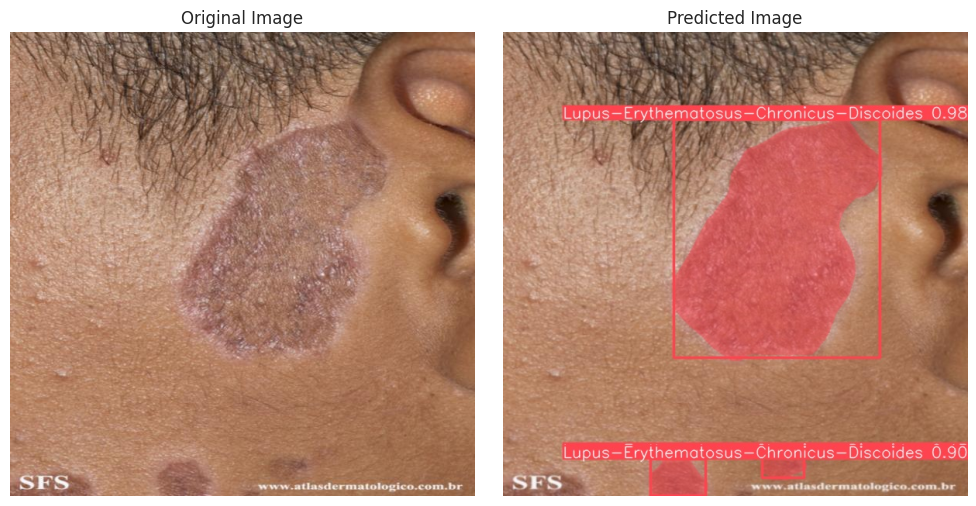

In [13]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# Path to the test images directory
test_images_path = '/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images'

# Get a list of all image file names in the test folder
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Randomly select one image from the test folder
random_image_name = random.choice(image_files)
random_image_path = os.path.join(test_images_path, random_image_name)

# Perform prediction on the randomly selected image
result = trained_model.predict(source=random_image_path, conf=0.25, save=True, save_txt=True, save_conf=True)

# Print the result object to find out where YOLO saves the prediction
print("Prediction result:", result)

# YOLO outputs predictions in its result object. Let's inspect that to find the correct folder.
output_dir = result[0].save_dir  # Access the directory where predictions are saved

print(f"YOLO saved predictions in: {output_dir}")

# Construct the predicted image path from the output directory and random image name
predicted_image_path = os.path.join(output_dir, random_image_name)

# Check if the predicted image exists and load it
if os.path.exists(predicted_image_path):
    # Load the predicted image
    predicted_image = cv2.imread(predicted_image_path)
    predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
else:
    print(f"Predicted image not found at {predicted_image_path}")
    predicted_image = None

# Load the original image
original_image = cv2.imread(random_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

# Plot the original and predicted images side by side
plt.figure(figsize=(10, 5))

# Show the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Show the predicted image if available
if predicted_image is not None:
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.title('Predicted Image')
    plt.axis('off')

# Display the images
plt.tight_layout()
plt.show()



image 1/1 /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images/LEISHMANIOSE-6-_jpg.rf.f39e1cbc8bbc3c448893466fd38eb8b6.jpg: 640x640 1 Leishmanios, 1 Psoriasis, 14.7ms
Speed: 2.7ms preprocess, 14.7ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict
325 labels saved to runs/segment/predict/labels
Prediction result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'Darier_s-Disease', 1: 'Epidermolysis-Bullosa-Pruriginosa', 2: 'Hailey-Hailey-Disease', 3: 'Hemangiome', 4: 'Impetigo', 5: 'Leishmanios', 6: 'Lupus-Erythematosus-Chronicus-Discoides', 7: 'Melanoma', 8: 'Molluscum-Contagiosum', 9: 'Porokeratosis', 10: 'Psoriasis', 11: 'Tinea-Corporis', 12: 'Tungiasis', 13: 'acne', 14: 'basal-cell-carcinoma', 15: 'eczema', 16: 'lichen', 17: 'nevus', 18: 'normal skin'}
obb: None
orig_img: array(

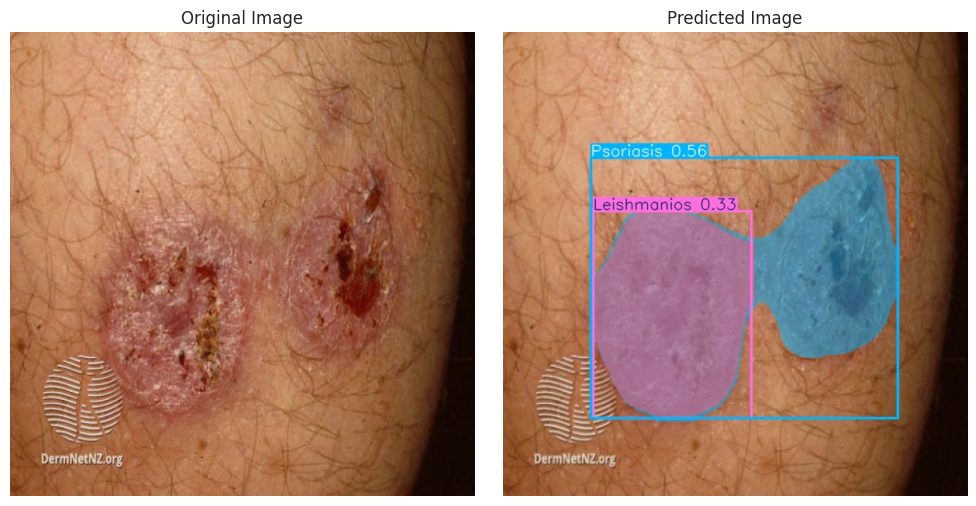

In [14]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# Path to the test images directory
test_images_path = '/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images'

# Get a list of all image file names in the test folder
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Randomly select one image from the test folder
random_image_name = random.choice(image_files)
random_image_path = os.path.join(test_images_path, random_image_name)

# Perform prediction on the randomly selected image
result = trained_model.predict(source=random_image_path, conf=0.25, save=True, save_txt=True, save_conf=True)

# Print the result object to find out where YOLO saves the prediction
print("Prediction result:", result)

# YOLO outputs predictions in its result object. Let's inspect that to find the correct folder.
output_dir = result[0].save_dir  # Access the directory where predictions are saved

print(f"YOLO saved predictions in: {output_dir}")

# Construct the predicted image path from the output directory and random image name
predicted_image_path = os.path.join(output_dir, random_image_name)

# Check if the predicted image exists and load it
if os.path.exists(predicted_image_path):
    # Load the predicted image
    predicted_image = cv2.imread(predicted_image_path)
    predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
else:
    print(f"Predicted image not found at {predicted_image_path}")
    predicted_image = None

# Load the original image
original_image = cv2.imread(random_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

# Plot the original and predicted images side by side
plt.figure(figsize=(10, 5))

# Show the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Show the predicted image if available
if predicted_image is not None:
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.title('Predicted Image')
    plt.axis('off')

# Display the images
plt.tight_layout()
plt.show()



image 1/1 /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images/Tungiasis-11-_jpg.rf.a240858ed8d360cb760db0f3b1e42126.jpg: 640x640 3 Epidermolysis-Bullosa-Pruriginosas, 26.2ms
Speed: 2.7ms preprocess, 26.2ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict
325 labels saved to runs/segment/predict/labels
Prediction result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'Darier_s-Disease', 1: 'Epidermolysis-Bullosa-Pruriginosa', 2: 'Hailey-Hailey-Disease', 3: 'Hemangiome', 4: 'Impetigo', 5: 'Leishmanios', 6: 'Lupus-Erythematosus-Chronicus-Discoides', 7: 'Melanoma', 8: 'Molluscum-Contagiosum', 9: 'Porokeratosis', 10: 'Psoriasis', 11: 'Tinea-Corporis', 12: 'Tungiasis', 13: 'acne', 14: 'basal-cell-carcinoma', 15: 'eczema', 16: 'lichen', 17: 'nevus', 18: 'normal skin'}
obb: None
orig_img

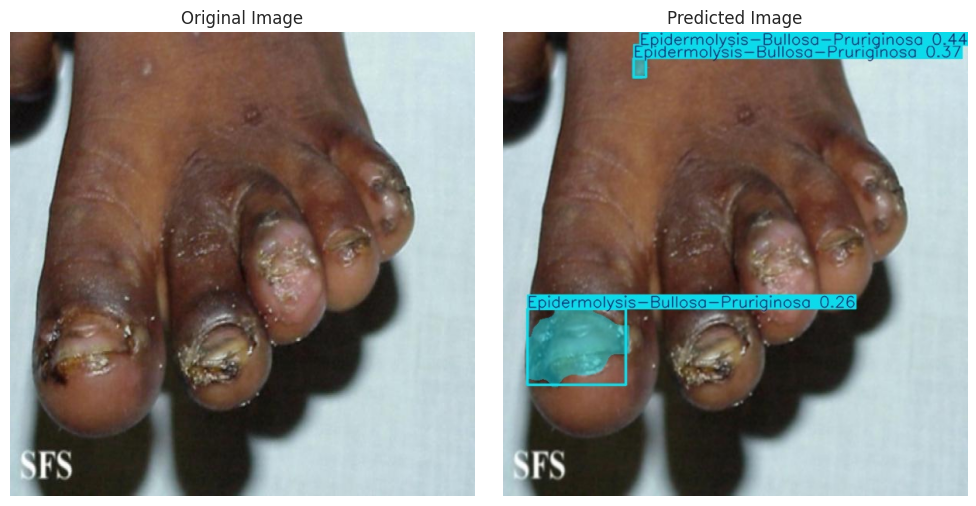

In [15]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# Path to the test images directory
test_images_path = '/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images'

# Get a list of all image file names in the test folder
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Randomly select one image from the test folder
random_image_name = random.choice(image_files)
random_image_path = os.path.join(test_images_path, random_image_name)

# Perform prediction on the randomly selected image
result = trained_model.predict(source=random_image_path, conf=0.25, save=True, save_txt=True, save_conf=True)

# Print the result object to find out where YOLO saves the prediction
print("Prediction result:", result)

# YOLO outputs predictions in its result object. Let's inspect that to find the correct folder.
output_dir = result[0].save_dir  # Access the directory where predictions are saved

print(f"YOLO saved predictions in: {output_dir}")

# Construct the predicted image path from the output directory and random image name
predicted_image_path = os.path.join(output_dir, random_image_name)

# Check if the predicted image exists and load it
if os.path.exists(predicted_image_path):
    # Load the predicted image
    predicted_image = cv2.imread(predicted_image_path)
    predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
else:
    print(f"Predicted image not found at {predicted_image_path}")
    predicted_image = None

# Load the original image
original_image = cv2.imread(random_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

# Plot the original and predicted images side by side
plt.figure(figsize=(10, 5))

# Show the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Show the predicted image if available
if predicted_image is not None:
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.title('Predicted Image')
    plt.axis('off')

# Display the images
plt.tight_layout()
plt.show()



image 1/1 /kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images/Impetigo-27-_jpg.rf.70ca648181293d401b16964b5b0cd325.jpg: 640x640 4 Impetigos, 26.2ms
Speed: 2.9ms preprocess, 26.2ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict
325 labels saved to runs/segment/predict/labels
Prediction result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'Darier_s-Disease', 1: 'Epidermolysis-Bullosa-Pruriginosa', 2: 'Hailey-Hailey-Disease', 3: 'Hemangiome', 4: 'Impetigo', 5: 'Leishmanios', 6: 'Lupus-Erythematosus-Chronicus-Discoides', 7: 'Melanoma', 8: 'Molluscum-Contagiosum', 9: 'Porokeratosis', 10: 'Psoriasis', 11: 'Tinea-Corporis', 12: 'Tungiasis', 13: 'acne', 14: 'basal-cell-carcinoma', 15: 'eczema', 16: 'lichen', 17: 'nevus', 18: 'normal skin'}
obb: None
orig_img: array([[[100, 114, 150],

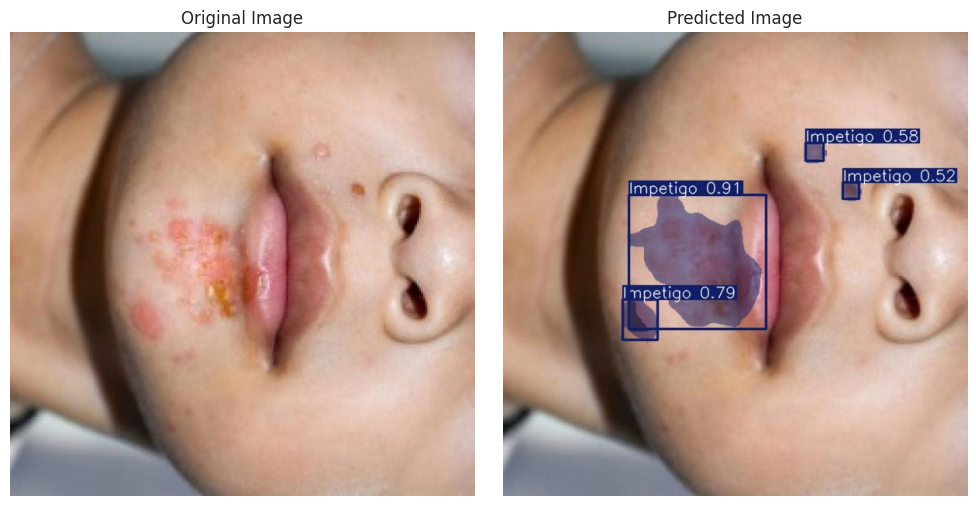

In [16]:
import random
import os
import cv2
import matplotlib.pyplot as plt

# Path to the test images directory
test_images_path = '/kaggle/input/skindisease/skin disease dataset.v38i.yolov11/test/images'

# Get a list of all image file names in the test folder
image_files = [f for f in os.listdir(test_images_path) if os.path.isfile(os.path.join(test_images_path, f))]

# Randomly select one image from the test folder
random_image_name = random.choice(image_files)
random_image_path = os.path.join(test_images_path, random_image_name)

# Perform prediction on the randomly selected image
result = trained_model.predict(source=random_image_path, conf=0.25, save=True, save_txt=True, save_conf=True)

# Print the result object to find out where YOLO saves the prediction
print("Prediction result:", result)

# YOLO outputs predictions in its result object. Let's inspect that to find the correct folder.
output_dir = result[0].save_dir  # Access the directory where predictions are saved

print(f"YOLO saved predictions in: {output_dir}")

# Construct the predicted image path from the output directory and random image name
predicted_image_path = os.path.join(output_dir, random_image_name)

# Check if the predicted image exists and load it
if os.path.exists(predicted_image_path):
    # Load the predicted image
    predicted_image = cv2.imread(predicted_image_path)
    predicted_image = cv2.cvtColor(predicted_image, cv2.COLOR_BGR2RGB)
else:
    print(f"Predicted image not found at {predicted_image_path}")
    predicted_image = None

# Load the original image
original_image = cv2.imread(random_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

# Plot the original and predicted images side by side
plt.figure(figsize=(10, 5))

# Show the original image
plt.subplot(1, 2, 1)
plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')

# Show the predicted image if available
if predicted_image is not None:
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_image)
    plt.title('Predicted Image')
    plt.axis('off')

# Display the images
plt.tight_layout()
plt.show()


In [17]:
import shutil

# Specify the name of the zip file (without the .zip extension)
zip_filename = '/kaggle/working/my_working_directory'  # Change 'my_working_directory' to your preferred name

# Create a zip file from the entire working directory
shutil.make_archive(zip_filename, 'zip', '/kaggle/working/')



'/kaggle/working/my_working_directory.zip'